# Forest Fire Burn Area Data Pre-processing and EDA
Written by: Marshall Mykietyshyn

Data hosted on [UCI Machine Learning Repository](http://archive.ics.uci.edu/ml/datasets/Forest+Fires).

The purpose of this notebook is to do a preliminary exploratory data analysis (EDA) on the forest fire burn area dataset. This is a popular regression dataset found on both Kaggle and the UCI Machine Learning Repository. The two data sets are identical, but the one used here was downloaded from UCI. The target variable is burn area, which can be predicted by a set of feature variables listed below. As can be seen, there are two categorical features, which must be converted to numerical entries in order to perform a regression analysis. Additionally, the data must be searched for missing and invalid entries, and these must be handled accordingly. The forest fire weather index (FWI) system features FFMC, DMC, DC and ISI are described [here](https://cwfis.cfs.nrcan.gc.ca/background/summary/fwi).

1. X - x-axis spatial coordinate within the Montesinho park map: 1 to 9
2. Y - y-axis spatial coordinate within the Montesinho park map: 2 to 9
3. month - month of the year: 'jan' to 'dec'
4. day - day of the week: 'mon' to 'sun'
5. FFMC - FFMC index from the FWI system: 18.7 to 96.20
6. DMC - DMC index from the FWI system: 1.1 to 291.3
7. DC - DC index from the FWI system: 7.9 to 860.6
8. ISI - ISI index from the FWI system: 0.0 to 56.10
9. temp - temperature in Celsius degrees: 2.2 to 33.30
10. RH - relative humidity in %: 15.0 to 100
11. wind - wind speed in km/h: 0.40 to 9.40
12. rain - outside rain in mm/m2 : 0.0 to 6.4
13. area - the burned area of the forest (in ha): 0.00 to 1090.84


In [1]:
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
import pandas_profiling
from sklearn.preprocessing import LabelEncoder


## Data Pre-processing
First check for NaNa and missing entries. Then convert the categorical entries to numerical.

In [2]:
data = pd.read_csv('data/forestfires.csv')
display(data.head(n=5))


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


In [3]:
# Check for NaNs
data.isna().sum()


X        0
Y        0
month    0
day      0
FFMC     0
DMC      0
DC       0
ISI      0
temp     0
RH       0
wind     0
rain     0
area     0
dtype: int64

In [4]:
# Check for non-numerical values in numerical columns
data.applymap(np.isreal).sum()


X        517
Y        517
month      0
day        0
FFMC     517
DMC      517
DC       517
ISI      517
temp     517
RH       517
wind     517
rain     517
area     517
dtype: int64

In [5]:
# Check for missing values
data.describe()


,X,Y,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,4.669246,4.299807,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292
std,2.313778,1.229900,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818
min,1.000000,2.000000,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000
25%,3.000000,4.000000,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000
50%,4.000000,4.000000,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000
75%,7.000000,5.000000,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000
max,9.000000,9.000000,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000


In [6]:
# Run data analysis
data.profile_report()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# Check for categorical labels that mean the same thing but differ in a non-meaningful way
#  For example, case differences 'January' vs 'january'
for i, col in enumerate(data.select_dtypes(['object', 'category']).columns):
    display(data[col].unique())


array(['mar', 'oct', 'aug', 'sep', 'apr', 'jun', 'jul', 'feb', 'jan',
       'dec', 'may', 'nov'], dtype=object)

array(['fri', 'tue', 'sat', 'sun', 'mon', 'wed', 'thu'], dtype=object)

In [8]:
# Visualize the duplicated rows
data[data.duplicated()]
# data.drop_duplicates(inplace=True)


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
53,4,3,aug,wed,92.1,111.2,654.1,9.6,20.4,42,4.9,0.0,0.00
100,3,4,aug,sun,91.4,142.4,601.4,10.6,19.8,39,5.4,0.0,0.00
215,4,4,mar,sat,91.7,35.8,80.8,7.8,17.0,27,4.9,0.0,28.66
303,3,6,jun,fri,91.1,94.1,232.1,7.1,19.2,38,4.5,0.0,0.00


In [9]:
# Map the month strings to ordered numerical values
num_months = {'jan': 0, 'feb': 1, 'mar': 2, 'apr': 3, 'may': 4, 'jun': 5,
              'jul': 6, 'aug': 7, 'sep': 8, 'oct': 9, 'nov': 10, 'dec': 11}
data_pp = data.copy()
data_pp['month'] = data_pp['month'].map(num_months)
display(data_pp['month'].dtype)

# Convert categorical values to numerical based on data type
le = LabelEncoder()
for col in data_pp.columns:
    # Compare if the dtype is object
    if data_pp[col].dtype=='object':
    # Use LabelEncoder to do the numeric transformation
        data_pp[col]=le.fit_transform(data_pp[col])
data_pp.head(n=6)
        

dtype('int64')

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,2,0,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,9,5,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,9,2,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,2,0,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,2,3,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0
5,8,6,7,3,92.3,85.3,488.0,14.7,22.2,29,5.4,0.0,0.0


In [10]:
# Save the pre-processed data
data_pp.to_csv('data/forestfires_preprocessed.csv', index=False)


We're in luck! This dataset seems to be in good order. There are no NaNs, missing entries, or labelling issues. All numerical columns only include real values. There are four duplicated rows. Although it seem unlikely that these exact sets of values were measured more than once, I cannot know that for sure. Therefore, they will not be removed them from the dataset. Finally, the categorical columns are converted to numerical values, as required by most regression algorithms and to make visualization easier. Since the label encoder converts categories alphabetically, and I wanted to keep the order of the months for visualization purposes, I mapped these values manually.


## Data Exploration
The first step in exploration is often to visualize the data. This is done here using the seaborn library's built-in pairplot() function, which visualizes the feature distributions and correlative relationships. Here, we can see that most of the data is approximately normally distributed, although with some skewness, and identify the presence of outliers. The outliers are visually examined below, to see if they are the result of some obvious error. This is where domain expertise in the area of the data is useful. 

There are a few features which display a significant imbalance in the data. There are many more samples from the months of August and September than from other months. In the case of rain, there are many more data points with zero rain than otherwise. This imbalanced could be handled by over- or under-sampling the data. However, since the imbalanced is so stark, it is probably worth looking at how removing the feature completely affects the results. Furthermore, the target variable contains a high number of zeros, which likely will affect any analysis performed. Although these are serious concerns, how these imbalances should be handled depends on the particular analysis being performed. Therefore, this will not be addressed further here.

DC appears to have a bimodal distribution which could be indicative of an important relationship. Although, there is no clear correlation between DC and area. The modalities appear to correspond to the winter vs. summer months, and thus could simply be a seasonal indicator. 

In the correlation plot, we see that none of the features correlate significantly with the target variable. Therefore, as mentioned in the description of the dataset, this is likely not an easy to predict value. This will be explored in further analyses. 

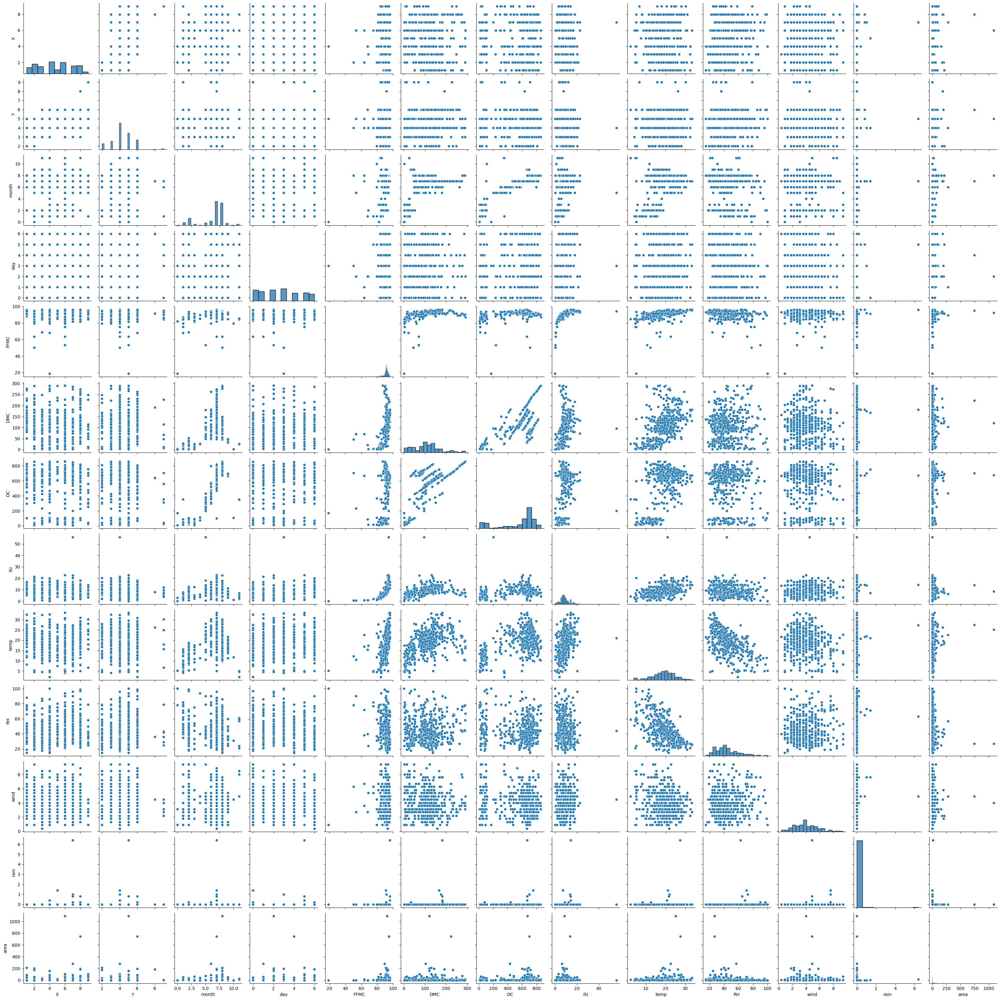

In [11]:
# Visualize the relationships between the features
# sb.pairplot(data, hue='area')
sb.pairplot(data_pp)
plt.show()


In [12]:
# Look at the outliers
# FFMC
display(data['FFMC'].std())
display(data[data['FFMC'] < 60])

# ISI
display(data[data['ISI'] > 30])

# Area
display(data[data['area'] > 500])


5.5201108488512665

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
299,6,5,jun,sat,53.4,71.0,233.8,0.4,10.6,90,2.7,0.0,0.0
312,2,4,sep,sun,50.4,46.2,706.6,0.4,12.2,78,6.3,0.0,0.0
379,4,5,jan,sun,18.7,1.1,171.4,0.0,5.2,100,0.9,0.0,0.0


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
22,7,4,jun,sun,94.3,96.3,200.0,56.1,21.0,44,4.5,0.0,0.0


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
238,6,5,sep,sat,92.5,121.1,674.4,8.6,25.1,27,4.0,0.0,1090.84
415,8,6,aug,thu,94.8,222.4,698.6,13.9,27.5,27,4.9,0.0,746.28


The outliers all seem to make intuitive sense. The instances of particularly low FFMC (a measure of flammability) are low when relative humidity is fairly high temp is low. The spread index ISI) is particularly high when there are strong winds, warm temperature and low humidity. And large burn areas occurred when temperatures were high, humidity was low and the wind was moderately strong. Since I do not have any domain expertise in this area, I cannot reasonably exclude these points from the analysis. 

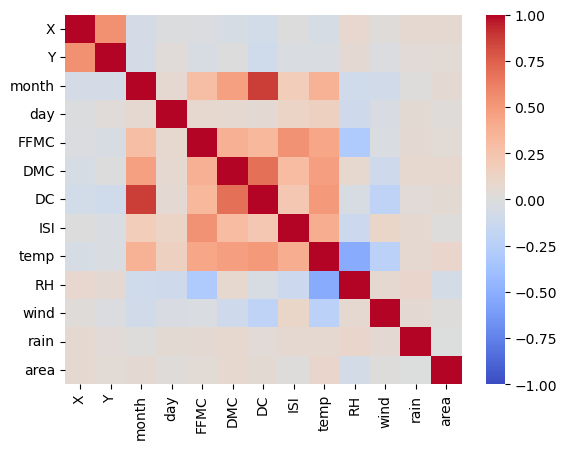

In [13]:
# Correlation matrix
sb.heatmap(data_pp.corr(), cmap='coolwarm', vmin=-1, vmax=1)
plt.show()
